<a href="https://colab.research.google.com/github/realfolkcode/IDAO-2022-First-Stage/blob/main/IDAO_2022_submission.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and import

In [ ]:
!pip install pymatgen

In [ ]:
!pip install megnet

In [ ]:
import yaml
import json

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras

from pathlib import Path
from pymatgen.core import Structure
from sklearn.model_selection import train_test_split
from megnet.models import MEGNetModel
from megnet.data.crystal import CrystalGraph

import matplotlib.pyplot as plt
%matplotlib inline

# Utils

In [ ]:
def read_pymatgen_dict(file):
    with open(file, "r") as f:
        d = json.load(f)
    return Structure.from_dict(d)

def prepare_dataset(dataset_path):
    dataset_path = Path(dataset_path)
    targets = pd.read_csv(dataset_path / "targets.csv", index_col=0)
    struct = {
        item.name.strip(".json"): read_pymatgen_dict(item)
        for item in (dataset_path / "structures").iterdir()
    }

    data = pd.DataFrame(columns=["structures"], index=struct.keys())
    data = data.assign(structures=struct.values(), targets=targets)

    #return train_test_split(data, test_size=0.25, random_state=666)
    return data

def prepare_test(dataset_path):
    dataset_path = Path(dataset_path)
    struct = {item.name.strip('.json'): read_pymatgen_dict(item) for item in (dataset_path/'structures').iterdir()}
    private_test = pd.DataFrame(columns=['id', 'structures'], index=struct.keys())
    private_test = private_test.assign(structures=struct.values())

    return private_test

In [ ]:
def energy_within_threshold(prediction, target):
    # compute absolute error on energy per system.
    # then count the no. of systems where max energy error is < 0.02.
    e_thresh = 0.02
    error_energy = tf.math.abs(target - prediction)

    success = tf.math.count_nonzero(error_energy < e_thresh)
    total = tf.size(target)
    return success / tf.cast(total, tf.int64)

# Download data

In [ ]:
!wget https://github.com/HSE-LAMBDA/IDAO-2022/raw/main/data/dichalcogenides_public.tar.gz
!wget https://github.com/HSE-LAMBDA/IDAO-2022/raw/main/data/dichalcogenides_private.tar.gz

--2022-03-16 20:21:53--  https://github.com/HSE-LAMBDA/IDAO-2022/raw/main/data/dichalcogenides_public.tar.gz
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/HSE-LAMBDA/IDAO-2022/main/data/dichalcogenides_public.tar.gz [following]
--2022-03-16 20:21:53--  https://raw.githubusercontent.com/HSE-LAMBDA/IDAO-2022/main/data/dichalcogenides_public.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6652136 (6.3M) [application/octet-stream]
Saving to: ‘dichalcogenides_public.tar.gz.1’

dichalcogenides_pub 100%[===================>]   6.34M  --.-KB/s    in 0.09s   

2022-03-16 20:21:53 (72.8 MB/s) - ‘

In [ ]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


In [ ]:
!tar -xvf /content/dichalcogenides_public.tar.gz -C data

dichalcogenides_public/
dichalcogenides_public/structures/
dichalcogenides_public/structures/614206adbaaf234b352905a0.json
dichalcogenides_public/structures/6141f01e4e27a1844a5f0430.json
dichalcogenides_public/structures/6141da6c4e27a1844a5f026c.json
dichalcogenides_public/structures/6141fac3baaf234b35290548.json
dichalcogenides_public/structures/6142738b3ac25c70a5c6cbd5.json
dichalcogenides_public/structures/6141da0fbaaf234b352903a0.json
dichalcogenides_public/structures/6141fed79cbada84a8676be3.json
dichalcogenides_public/structures/6141f8914e27a1844a5f04a8.json
dichalcogenides_public/structures/61422c254e27a1844a5f0684.json
dichalcogenides_public/structures/6142c0a131cf3ef3d4a9f60c.json
dichalcogenides_public/structures/6142015831cf3ef3d4a9f20c.json
dichalcogenides_public/structures/614217adee0a3fd43fb47e85.json
dichalcogenides_public/structures/61433f2631cf3ef3d4a9f714.json
dichalcogenides_public/structures/6141cf1651c1cbd9654b8876.json
dichalcogenides_public/structures/6141e1abbaa

In [ ]:
!tar -xvf /content/dichalcogenides_private.tar.gz -C data

dichalcogenides_private/
dichalcogenides_private/structures/
dichalcogenides_private/structures/6141d2bebaaf234b352902c2.json
dichalcogenides_private/structures/61422f8c31cf3ef3d4a9f3a0.json
dichalcogenides_private/structures/6141cf2f9cbada84a86767ed.json
dichalcogenides_private/structures/6141d16cbaaf234b35290282.json
dichalcogenides_private/structures/6141d4f9ee0a3fd43fb47b7f.json
dichalcogenides_private/structures/61421360ee0a3fd43fb47e77.json
dichalcogenides_private/structures/6141d40c31cf3ef3d4a9eeda.json
dichalcogenides_private/structures/61428c6231cf3ef3d4a9f570.json
dichalcogenides_private/structures/61428491baaf234b352906f6.json
dichalcogenides_private/structures/614224c69cbada84a8676ca9.json
dichalcogenides_private/structures/6141d130baaf234b35290276.json
dichalcogenides_private/structures/6142aebc3ac25c70a5c6cc2d.json
dichalcogenides_private/structures/61420dd83ac25c70a5c6ca91.json
dichalcogenides_private/structures/6142a6b44e27a1844a5f08d0.json
dichalcogenides_private/struc

In [ ]:
datapath = './data/dichalcogenides_public'
test_datapath = './data/dichalcogenides_private'

# Prepare dataset

In [ ]:
df = prepare_dataset(datapath)

In [ ]:
df

,structures,targets
614326714e27a1844a5f09e6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1462
6142204c4e27a1844a5f0628,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1473
6141d8d39cbada84a86769e7,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.8091
61424bb531cf3ef3d4a9f440,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3540
6143c9ed31cf3ef3d4a9f79e,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.2879
...,...,...
6141d75dee0a3fd43fb47bcb,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3585
6141d18d9cbada84a86768db,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.8087
6141e1c1baaf234b35290420,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1008
61421a5e3ac25c70a5c6cabd,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3383


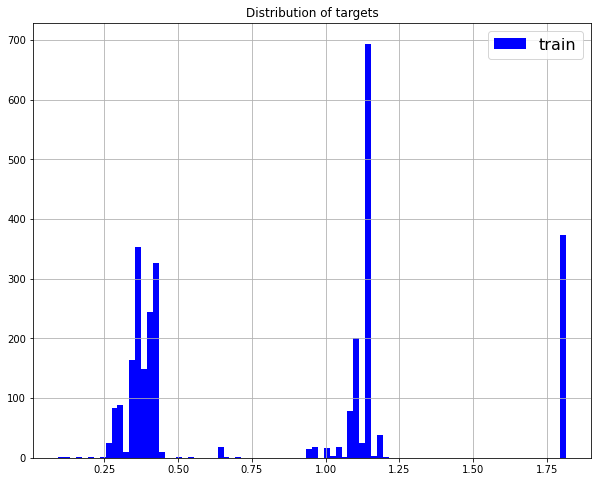

In [ ]:
plt.figure(figsize=(10, 8))

epsilon = 0.02
plt.hist(
    df['targets'], 
    bins=np.arange(np.min(df['targets']), np.max(df['targets']) + epsilon, epsilon), 
    color='blue', label='train'
)

plt.grid()
plt.legend(fontsize=16)
plt.title('Distribution of targets')
plt.show()

As can be seen from the plot above, the targets are clustered in 3 groups. The right one has a shape of peak. We have discovered that this cluster corresponds to the structures without gaps. Further, we separate such structures from the train and test sets.

In [ ]:
max_num_sites = max(structure.num_sites for structure in df['structures'])

In [ ]:
has_gaps = df['structures'].apply(lambda structure: max_num_sites != structure.num_sites)
has_gaps

614326714e27a1844a5f09e6     True
6142204c4e27a1844a5f0628     True
6141d8d39cbada84a86769e7    False
61424bb531cf3ef3d4a9f440     True
6143c9ed31cf3ef3d4a9f79e     True
                            ...  
6141d75dee0a3fd43fb47bcb     True
6141d18d9cbada84a86768db    False
6141e1c1baaf234b35290420     True
61421a5e3ac25c70a5c6cabd     True
6141fe4f4e27a1844a5f04f6     True
Name: structures, Length: 2966, dtype: bool

In [ ]:
train = df[has_gaps]
train

,structures,targets
614326714e27a1844a5f09e6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1462
6142204c4e27a1844a5f0628,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1473
61424bb531cf3ef3d4a9f440,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3540
6143c9ed31cf3ef3d4a9f79e,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.2879
6141dd474e27a1844a5f02bc,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1451
...,...,...
6141d65931cf3ef3d4a9ef32,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4207
6141d75dee0a3fd43fb47bcb,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3585
6141e1c1baaf234b35290420,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1008
61421a5e3ac25c70a5c6cabd,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3383


In [ ]:
has_gaps_target_mean = df[~has_gaps]['targets'].mean()
has_gaps_target_mean

1.8083254010695182

In [ ]:
train, test = train_test_split(train, test_size=0.1, random_state=666)

In [ ]:
train

,structures,targets
6141d3e7baaf234b352902f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0960
61432cc53ac25c70a5c6ccb9,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.2996
614221da31cf3ef3d4a9f340,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4138
614248d44e27a1844a5f0734,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1425
6142f8723ac25c70a5c6cc85,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3602
...,...,...
6141eb43ee0a3fd43fb47d43,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3609
6141cf57a05be5973bd77a83,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469
6141d0f44e27a1844a5f00f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1468
61425380baaf234b352906b6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.6500


In [ ]:
test

,structures,targets
6142255f4e27a1844a5f0656,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1488
6141e1d831cf3ef3d4a9f058,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3595
6141d67e4e27a1844a5f01f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469
6141f0384e27a1844a5f0432,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1441
614217ce31cf3ef3d4a9f2e8,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3917
...,...,...
6141e0034e27a1844a5f0304,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1465
6142986d3ac25c70a5c6cc0b,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3477
614282ffbaaf234b352906f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.6530
6141e29c4e27a1844a5f033c,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1448


In [ ]:
private_test = prepare_test(test_datapath)

In [ ]:
private_test

,id,structures
61434fc631cf3ef3d4a9f730,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141df4931cf3ef3d4a9f020,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6144059f4e27a1844a5f0a90,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141da0e31cf3ef3d4a9efa0,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141fbfcbaaf234b35290550,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
...,...,...
6141db2cbaaf234b352903b6,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141e12fbaaf234b35290416,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141ef349cbada84a8676b5b,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
614272454e27a1844a5f07f8,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...


In [ ]:
private_has_gaps = private_test['structures'].apply(lambda structure: max_num_sites != structure.num_sites)
private_has_gaps

61434fc631cf3ef3d4a9f730     True
6141df4931cf3ef3d4a9f020     True
6144059f4e27a1844a5f0a90     True
6141da0e31cf3ef3d4a9efa0     True
6141fbfcbaaf234b35290550     True
                            ...  
6141db2cbaaf234b352903b6     True
6141e12fbaaf234b35290416     True
6141ef349cbada84a8676b5b    False
614272454e27a1844a5f07f8     True
6146d5293ac25c70a5c6cde9     True
Name: structures, Length: 2967, dtype: bool

In [ ]:
print('Ratio of structures with gaps in private test:', private_has_gaps.sum() / len(private_test))

Ratio of structures with gaps in private test: 0.8634984833164813


In [ ]:
private_test, private_test_null = private_test[private_has_gaps], private_test[~private_has_gaps]

In [ ]:
private_test

,id,structures
61434fc631cf3ef3d4a9f730,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141df4931cf3ef3d4a9f020,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6144059f4e27a1844a5f0a90,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141da0e31cf3ef3d4a9efa0,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141fbfcbaaf234b35290550,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
...,...,...
6141d37531cf3ef3d4a9eebe,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141db2cbaaf234b352903b6,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141e12fbaaf234b35290416,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
614272454e27a1844a5f07f8,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...


In [ ]:
private_test_null

,id,structures
6142076d9cbada84a8676c2d,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6142192b9cbada84a8676c85,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141cf249cbada84a86767df,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141d1319cbada84a86768c5,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
61420e0a9cbada84a8676c59,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
...,...,...
6141dd6d9cbada84a8676a53,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141dd209cbada84a8676a4d,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141cf18b842c2e72e2f2d58,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...
6141da759cbada84a8676a11,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...


# Visualization

In [ ]:
import plotly.express as px

In [ ]:
def plot_structure_3d(structure):
    color_lst = []
    idx = 0
    color_dict = {}
    for elem in structure.species:
        if elem not in color_dict:
            color_dict[elem] = idx
            idx += 1
    for elem in structure.species:
        color_lst.append(color_dict[elem])
    
    fig = px.scatter_3d(structure.cart_coords, 
                    x=0, y=1, z=2, 
                    color=color_lst)
    fig.update_layout(scene=dict(aspectmode="data"))
    fig.show()

In [ ]:
plot_structure_3d(train.iloc[15]['structures'])

In [ ]:
plot_structure_3d(private_test.iloc[18]['structures'])

# Transfer learning

Here we load a pretrained model for predicting formation energy task. Essentially we perform transfer learning that is described in https://github.com/materialsvirtuallab/megnet/blob/master/notebooks/transfer_learning.ipynb.

**You can omit running the cells from this section since we provide already fine-tuned model in our repository.**

In [ ]:
from google.colab import files
files.upload()

Saving formation_energy.hdf5 to formation_energy.hdf5
Saving formation_energy.hdf5.json to formation_energy.hdf5.json


{'formation_energy.hdf5': b'\x89HDF\r\n\x1a\n\x00\x00\x00\x00\x00\x08\x08\x00\x04\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x87\x0c\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x01\x00\x08\x00\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x10\x00\x10\x00\x00\x00\x00\x00 \x03\x00\x00\x00\x00\x00\x00\x18\x01\x00\x00\x00\x00\x00\x00TREE\x00\x00\x01\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\xc0Q\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

In [ ]:
model_form = MEGNetModel.from_file('formation_energy.hdf5')

In [ ]:
embedding_layer = [i for i in model_form.layers if i.name.startswith('embedding')][0]
embedding = embedding_layer.get_weights()[0]
print('Embedding matrix dimension is ', embedding.shape)

Embedding matrix dimension is  (95, 16)


In [ ]:
MEGNetModel?

In [ ]:
r_cutoff = 2.5
nfeat_bond = 100
gaussian_centers = np.linspace(0, r_cutoff + 1, nfeat_bond)
gaussian_width = 0.5
model = MEGNetModel(nfeat_bond=nfeat_bond,
                    graph_converter=CrystalGraph(cutoff=r_cutoff),
                    centers=gaussian_centers,
                    width=gaussian_width,
                    nvocal=95, 
                    embedding_dim=16,
                    loss="MAE",
                    lr=1e-3,
                    metrics=energy_within_threshold)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
# find the embedding layer  index in all the model layers
embedding_layer_index = [i for i, j in enumerate(model.layers) if j.name.startswith('atom_embedding')][0]

# Set the weights to our previous embedding
model.layers[embedding_layer_index].set_weights([embedding])

# Freeze the weights
model.layers[embedding_layer_index].trainable = False

In [ ]:
epochs = 800
batch_size = 128

In [ ]:
model.train(
    train.structures,
    train.targets,
    validation_structures=test.structures,
    validation_targets=test.targets,
    epochs=epochs,
    batch_size=batch_size
)

Epoch 1/800
19/19 [==============================] - ETA: 0s - loss: 0.3898 - energy_within_threshold: 0.0189

INFO:megnet.callbacks:
Epoch 00001: val_mae improved from inf to 0.32521, saving model to callback/val_mae_00001_0.325211.hdf5
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


19/19 [==============================] - 51s 1s/step - loss: 0.3898 - energy_within_threshold: 0.0189
Epoch 2/800
19/19 [==============================] - ETA: 0s - loss: 0.3411 - energy_within_threshold: 0.0479

INFO:megnet.callbacks:
Epoch 00002: val_mae improved from 0.32521 to 0.32181, saving model to callback/val_mae_00002_0.321813.hdf5


19/19 [==============================] - 14s 737ms/step - loss: 0.3411 - energy_within_threshold: 0.0479
Epoch 3/800
19/19 [==============================] - ETA: 0s - loss: 0.3322 - energy_within_threshold: 0.1733

INFO:megnet.callbacks:
Epoch 00003: val_mae improved from 0.32181 to 0.32041, saving model to callback/val_mae_00003_0.320411.hdf5


19/19 [==============================] - 14s 729ms/step - loss: 0.3322 - energy_within_threshold: 0.1733
Epoch 4/800
19/19 [==============================] - 14s 736ms/step - loss: 0.3362 - energy_within_threshold: 0.1428
Epoch 5/800
19/19 [==============================] - 13s 703ms/step - loss: 0.3344 - energy_within_threshold: 0.1720
Epoch 6/800
19/19 [==============================] - ETA: 0s - loss: 0.3325 - energy_within_threshold: 0.1812

INFO:megnet.callbacks:
Epoch 00006: val_mae improved from 0.32041 to 0.32017, saving model to callback/val_mae_00006_0.320172.hdf5


19/19 [==============================] - 14s 725ms/step - loss: 0.3325 - energy_within_threshold: 0.1812
Epoch 7/800
19/19 [==============================] - 13s 700ms/step - loss: 0.3304 - energy_within_threshold: 0.1849
Epoch 8/800
19/19 [==============================] - ETA: 0s - loss: 0.3317 - energy_within_threshold: 0.1386

INFO:megnet.callbacks:
Epoch 00008: val_mae improved from 0.32017 to 0.31993, saving model to callback/val_mae_00008_0.319932.hdf5


19/19 [==============================] - 14s 728ms/step - loss: 0.3317 - energy_within_threshold: 0.1386
Epoch 9/800
19/19 [==============================] - 14s 710ms/step - loss: 0.3345 - energy_within_threshold: 0.1435
Epoch 10/800
19/19 [==============================] - ETA: 0s - loss: 0.3326 - energy_within_threshold: 0.1716

INFO:megnet.callbacks:
Epoch 00010: val_mae improved from 0.31993 to 0.31961, saving model to callback/val_mae_00010_0.319608.hdf5


19/19 [==============================] - 14s 728ms/step - loss: 0.3326 - energy_within_threshold: 0.1716
Epoch 11/800
19/19 [==============================] - 14s 706ms/step - loss: 0.3294 - energy_within_threshold: 0.1749
Epoch 12/800
19/19 [==============================] - ETA: 0s - loss: 0.3346 - energy_within_threshold: 0.1771

INFO:megnet.callbacks:
Epoch 00012: val_mae improved from 0.31961 to 0.31810, saving model to callback/val_mae_00012_0.318104.hdf5


19/19 [==============================] - 14s 719ms/step - loss: 0.3346 - energy_within_threshold: 0.1771
Epoch 13/800
19/19 [==============================] - 13s 705ms/step - loss: 0.4583 - energy_within_threshold: 0.1009
Epoch 14/800
19/19 [==============================] - 14s 710ms/step - loss: 0.3611 - energy_within_threshold: 0.0226
Epoch 15/800
19/19 [==============================] - 14s 723ms/step - loss: 0.3358 - energy_within_threshold: 0.1115
Epoch 16/800
19/19 [==============================] - 14s 706ms/step - loss: 0.3354 - energy_within_threshold: 0.1656
Epoch 17/800
19/19 [==============================] - 14s 710ms/step - loss: 0.3320 - energy_within_threshold: 0.1791
Epoch 18/800
19/19 [==============================] - 13s 700ms/step - loss: 0.3281 - energy_within_threshold: 0.1716
Epoch 19/800
19/19 [==============================] - 13s 704ms/step - loss: 0.3282 - energy_within_threshold: 0.1346
Epoch 20/800
19/19 [==============================] - 14s 707ms/step 

INFO:megnet.callbacks:
Epoch 00023: val_mae improved from 0.31810 to 0.31502, saving model to callback/val_mae_00023_0.315016.hdf5


19/19 [==============================] - 14s 723ms/step - loss: 0.3275 - energy_within_threshold: 0.1660
Epoch 24/800
19/19 [==============================] - ETA: 0s - loss: 0.2990 - energy_within_threshold: 0.1759

INFO:megnet.callbacks:
Epoch 00024: val_mae improved from 0.31502 to 0.16980, saving model to callback/val_mae_00024_0.169804.hdf5


19/19 [==============================] - 14s 725ms/step - loss: 0.2990 - energy_within_threshold: 0.1759
Epoch 25/800
19/19 [==============================] - ETA: 0s - loss: 0.0887 - energy_within_threshold: 0.1866

INFO:megnet.callbacks:
Epoch 00025: val_mae improved from 0.16980 to 0.10973, saving model to callback/val_mae_00025_0.109734.hdf5


19/19 [==============================] - 14s 737ms/step - loss: 0.0887 - energy_within_threshold: 0.1866
Epoch 26/800
19/19 [==============================] - ETA: 0s - loss: 0.0575 - energy_within_threshold: 0.2871

INFO:megnet.callbacks:
Epoch 00026: val_mae improved from 0.10973 to 0.04917, saving model to callback/val_mae_00026_0.049168.hdf5


19/19 [==============================] - 14s 740ms/step - loss: 0.0575 - energy_within_threshold: 0.2871
Epoch 27/800
19/19 [==============================] - ETA: 0s - loss: 0.0440 - energy_within_threshold: 0.3839

INFO:megnet.callbacks:
Epoch 00027: val_mae improved from 0.04917 to 0.04890, saving model to callback/val_mae_00027_0.048897.hdf5


19/19 [==============================] - 14s 728ms/step - loss: 0.0440 - energy_within_threshold: 0.3839
Epoch 28/800
19/19 [==============================] - ETA: 0s - loss: 0.0488 - energy_within_threshold: 0.3519

INFO:megnet.callbacks:
Epoch 00028: val_mae improved from 0.04890 to 0.04760, saving model to callback/val_mae_00028_0.047602.hdf5


19/19 [==============================] - 14s 727ms/step - loss: 0.0488 - energy_within_threshold: 0.3519
Epoch 29/800
19/19 [==============================] - 14s 706ms/step - loss: 0.0456 - energy_within_threshold: 0.3759
Epoch 30/800
19/19 [==============================] - 14s 710ms/step - loss: 0.0470 - energy_within_threshold: 0.3346
Epoch 31/800
19/19 [==============================] - 14s 710ms/step - loss: 0.0443 - energy_within_threshold: 0.4354
Epoch 32/800
19/19 [==============================] - 14s 720ms/step - loss: 0.0436 - energy_within_threshold: 0.4084
Epoch 33/800
19/19 [==============================] - ETA: 0s - loss: 0.0454 - energy_within_threshold: 0.4087

INFO:megnet.callbacks:
Epoch 00033: val_mae improved from 0.04760 to 0.04758, saving model to callback/val_mae_00033_0.047580.hdf5


19/19 [==============================] - 14s 736ms/step - loss: 0.0454 - energy_within_threshold: 0.4087
Epoch 34/800
19/19 [==============================] - 14s 712ms/step - loss: 0.0424 - energy_within_threshold: 0.4375
Epoch 35/800
19/19 [==============================] - 14s 710ms/step - loss: 0.0436 - energy_within_threshold: 0.4003
Epoch 36/800
19/19 [==============================] - 14s 708ms/step - loss: 0.0459 - energy_within_threshold: 0.3814
Epoch 37/800
19/19 [==============================] - 14s 738ms/step - loss: 0.0426 - energy_within_threshold: 0.4355
Epoch 38/800
19/19 [==============================] - 13s 702ms/step - loss: 0.0436 - energy_within_threshold: 0.4097
Epoch 39/800
19/19 [==============================] - 14s 712ms/step - loss: 0.0427 - energy_within_threshold: 0.4394
Epoch 40/800
19/19 [==============================] - 13s 732ms/step - loss: 0.0430 - energy_within_threshold: 0.4510
Epoch 41/800
19/19 [==============================] - 13s 702ms/step 

INFO:megnet.callbacks:
Epoch 00046: val_mae improved from 0.04758 to 0.04755, saving model to callback/val_mae_00046_0.047553.hdf5


19/19 [==============================] - 14s 727ms/step - loss: 0.0435 - energy_within_threshold: 0.4037
Epoch 47/800
19/19 [==============================] - 13s 700ms/step - loss: 0.0452 - energy_within_threshold: 0.3664
Epoch 48/800
19/19 [==============================] - 14s 715ms/step - loss: 0.0430 - energy_within_threshold: 0.4121
Epoch 49/800
19/19 [==============================] - 14s 714ms/step - loss: 0.0430 - energy_within_threshold: 0.4414
Epoch 50/800
19/19 [==============================] - 14s 709ms/step - loss: 0.0431 - energy_within_threshold: 0.4505
Epoch 51/800
19/19 [==============================] - 14s 707ms/step - loss: 0.0450 - energy_within_threshold: 0.4451
Epoch 52/800
19/19 [==============================] - 14s 741ms/step - loss: 0.0442 - energy_within_threshold: 0.4606
Epoch 53/800
19/19 [==============================] - 14s 707ms/step - loss: 0.0429 - energy_within_threshold: 0.3984
Epoch 54/800
19/19 [==============================] - 14s 710ms/step 

INFO:megnet.callbacks:
Epoch 00083: val_mae improved from 0.04755 to 0.04750, saving model to callback/val_mae_00083_0.047497.hdf5


19/19 [==============================] - 14s 737ms/step - loss: 0.0438 - energy_within_threshold: 0.3725
Epoch 84/800
19/19 [==============================] - 14s 716ms/step - loss: 0.0435 - energy_within_threshold: 0.3883
Epoch 85/800
19/19 [==============================] - 14s 707ms/step - loss: 0.0425 - energy_within_threshold: 0.4167
Epoch 86/800
19/19 [==============================] - 14s 709ms/step - loss: 0.0430 - energy_within_threshold: 0.4239
Epoch 87/800
19/19 [==============================] - 14s 708ms/step - loss: 0.0421 - energy_within_threshold: 0.4284
Epoch 88/800
19/19 [==============================] - 14s 709ms/step - loss: 0.0446 - energy_within_threshold: 0.4586
Epoch 89/800
19/19 [==============================] - 14s 720ms/step - loss: 0.0439 - energy_within_threshold: 0.4193
Epoch 90/800
19/19 [==============================] - 14s 708ms/step - loss: 0.0453 - energy_within_threshold: 0.4090
Epoch 91/800
19/19 [==============================] - 14s 710ms/step 

INFO:megnet.callbacks:
Epoch 00115: val_mae improved from 0.04750 to 0.04747, saving model to callback/val_mae_00115_0.047473.hdf5


19/19 [==============================] - 14s 737ms/step - loss: 0.0428 - energy_within_threshold: 0.4273
Epoch 116/800
19/19 [==============================] - 14s 706ms/step - loss: 0.0442 - energy_within_threshold: 0.4450
Epoch 117/800
19/19 [==============================] - 14s 712ms/step - loss: 0.0441 - energy_within_threshold: 0.4132
Epoch 118/800
19/19 [==============================] - 14s 743ms/step - loss: 0.0428 - energy_within_threshold: 0.4524
Epoch 119/800
19/19 [==============================] - 14s 706ms/step - loss: 0.0435 - energy_within_threshold: 0.4387
Epoch 120/800
19/19 [==============================] - 14s 714ms/step - loss: 0.0435 - energy_within_threshold: 0.4344
Epoch 121/800
19/19 [==============================] - 14s 716ms/step - loss: 0.0426 - energy_within_threshold: 0.4434
Epoch 122/800
19/19 [==============================] - 14s 711ms/step - loss: 0.0445 - energy_within_threshold: 0.3946
Epoch 123/800
19/19 [==============================] - 14s 716

INFO:megnet.callbacks:
Epoch 00142: val_mae improved from 0.04747 to 0.04738, saving model to callback/val_mae_00142_0.047379.hdf5


19/19 [==============================] - 14s 726ms/step - loss: 0.0423 - energy_within_threshold: 0.4369
Epoch 143/800
19/19 [==============================] - 13s 700ms/step - loss: 0.0432 - energy_within_threshold: 0.4263
Epoch 144/800
19/19 [==============================] - 13s 701ms/step - loss: 0.0435 - energy_within_threshold: 0.4596
Epoch 145/800
19/19 [==============================] - 13s 697ms/step - loss: 0.0432 - energy_within_threshold: 0.3964
Epoch 146/800
19/19 [==============================] - 13s 727ms/step - loss: 0.0425 - energy_within_threshold: 0.4125
Epoch 147/800
19/19 [==============================] - 13s 704ms/step - loss: 0.0421 - energy_within_threshold: 0.4053
Epoch 148/800
19/19 [==============================] - 13s 702ms/step - loss: 0.0432 - energy_within_threshold: 0.4327
Epoch 149/800
19/19 [==============================] - 13s 698ms/step - loss: 0.0435 - energy_within_threshold: 0.4050
Epoch 150/800
19/19 [==============================] - 13s 695

INFO:megnet.callbacks:
Epoch 00157: val_mae improved from 0.04738 to 0.04733, saving model to callback/val_mae_00157_0.047333.hdf5


19/19 [==============================] - 14s 717ms/step - loss: 0.0427 - energy_within_threshold: 0.4277
Epoch 158/800
19/19 [==============================] - 13s 702ms/step - loss: 0.0431 - energy_within_threshold: 0.4618
Epoch 159/800
19/19 [==============================] - 13s 699ms/step - loss: 0.0428 - energy_within_threshold: 0.4508
Epoch 160/800
19/19 [==============================] - 13s 695ms/step - loss: 0.0437 - energy_within_threshold: 0.4437
Epoch 161/800
19/19 [==============================] - 13s 702ms/step - loss: 0.0433 - energy_within_threshold: 0.4268
Epoch 162/800
19/19 [==============================] - 14s 709ms/step - loss: 0.0443 - energy_within_threshold: 0.4463
Epoch 163/800
19/19 [==============================] - 13s 704ms/step - loss: 0.0440 - energy_within_threshold: 0.4528
Epoch 164/800
19/19 [==============================] - 14s 720ms/step - loss: 0.0440 - energy_within_threshold: 0.4074
Epoch 165/800
19/19 [==============================] - 14s 713

INFO:megnet.callbacks:
Epoch 00168: val_mae improved from 0.04733 to 0.04724, saving model to callback/val_mae_00168_0.047236.hdf5


19/19 [==============================] - 14s 710ms/step - loss: 0.0427 - energy_within_threshold: 0.4508
Epoch 169/800
19/19 [==============================] - 14s 706ms/step - loss: 0.0423 - energy_within_threshold: 0.4514
Epoch 170/800
19/19 [==============================] - 13s 703ms/step - loss: 0.0428 - energy_within_threshold: 0.4597
Epoch 171/800
19/19 [==============================] - 13s 689ms/step - loss: 0.0418 - energy_within_threshold: 0.4324
Epoch 172/800
19/19 [==============================] - ETA: 0s - loss: 0.0418 - energy_within_threshold: 0.4323

INFO:megnet.callbacks:
Epoch 00172: val_mae improved from 0.04724 to 0.04715, saving model to callback/val_mae_00172_0.047153.hdf5


19/19 [==============================] - 14s 713ms/step - loss: 0.0418 - energy_within_threshold: 0.4323
Epoch 173/800
19/19 [==============================] - 13s 698ms/step - loss: 0.0409 - energy_within_threshold: 0.4658
Epoch 174/800
19/19 [==============================] - ETA: 0s - loss: 0.0413 - energy_within_threshold: 0.4814

INFO:megnet.callbacks:
Epoch 00174: val_mae improved from 0.04715 to 0.04650, saving model to callback/val_mae_00174_0.046497.hdf5


19/19 [==============================] - 14s 706ms/step - loss: 0.0413 - energy_within_threshold: 0.4814
Epoch 175/800
19/19 [==============================] - 13s 695ms/step - loss: 0.0432 - energy_within_threshold: 0.4189
Epoch 176/800
19/19 [==============================] - 13s 725ms/step - loss: 0.0424 - energy_within_threshold: 0.5103
Epoch 177/800
19/19 [==============================] - 13s 699ms/step - loss: 0.0402 - energy_within_threshold: 0.4924
Epoch 178/800
19/19 [==============================] - ETA: 0s - loss: 0.0387 - energy_within_threshold: 0.5145

INFO:megnet.callbacks:
Epoch 00178: val_mae improved from 0.04650 to 0.04381, saving model to callback/val_mae_00178_0.043806.hdf5


19/19 [==============================] - 13s 707ms/step - loss: 0.0387 - energy_within_threshold: 0.5145
Epoch 179/800
19/19 [==============================] - 13s 682ms/step - loss: 0.0376 - energy_within_threshold: 0.5691
Epoch 180/800
19/19 [==============================] - 13s 680ms/step - loss: 0.0388 - energy_within_threshold: 0.5340
Epoch 181/800
19/19 [==============================] - 13s 697ms/step - loss: 0.0399 - energy_within_threshold: 0.5062
Epoch 182/800
19/19 [==============================] - 13s 708ms/step - loss: 0.0401 - energy_within_threshold: 0.4881
Epoch 183/800
19/19 [==============================] - ETA: 0s - loss: 0.0363 - energy_within_threshold: 0.5984

INFO:megnet.callbacks:
Epoch 00183: val_mae improved from 0.04381 to 0.04278, saving model to callback/val_mae_00183_0.042780.hdf5


19/19 [==============================] - 13s 704ms/step - loss: 0.0363 - energy_within_threshold: 0.5984
Epoch 184/800
19/19 [==============================] - 13s 700ms/step - loss: 0.0374 - energy_within_threshold: 0.5881
Epoch 185/800
19/19 [==============================] - 13s 687ms/step - loss: 0.0370 - energy_within_threshold: 0.5798
Epoch 186/800
19/19 [==============================] - 13s 692ms/step - loss: 0.0394 - energy_within_threshold: 0.5627
Epoch 187/800
19/19 [==============================] - 13s 683ms/step - loss: 0.0386 - energy_within_threshold: 0.5367
Epoch 188/800
19/19 [==============================] - ETA: 0s - loss: 0.0367 - energy_within_threshold: 0.5931

INFO:megnet.callbacks:
Epoch 00188: val_mae improved from 0.04278 to 0.04270, saving model to callback/val_mae_00188_0.042697.hdf5


19/19 [==============================] - 14s 722ms/step - loss: 0.0367 - energy_within_threshold: 0.5931
Epoch 189/800
19/19 [==============================] - 13s 692ms/step - loss: 0.0359 - energy_within_threshold: 0.5909
Epoch 190/800
19/19 [==============================] - 13s 684ms/step - loss: 0.0365 - energy_within_threshold: 0.5936
Epoch 191/800
19/19 [==============================] - 13s 678ms/step - loss: 0.0361 - energy_within_threshold: 0.6026
Epoch 192/800
19/19 [==============================] - 13s 701ms/step - loss: 0.0367 - energy_within_threshold: 0.5833
Epoch 193/800
19/19 [==============================] - 13s 688ms/step - loss: 0.0358 - energy_within_threshold: 0.5752
Epoch 194/800
19/19 [==============================] - 13s 686ms/step - loss: 0.0368 - energy_within_threshold: 0.5972
Epoch 195/800
19/19 [==============================] - 13s 711ms/step - loss: 0.0365 - energy_within_threshold: 0.5866
Epoch 196/800
19/19 [==============================] - 13s 690

INFO:megnet.callbacks:
Epoch 00211: val_mae improved from 0.04270 to 0.04243, saving model to callback/val_mae_00211_0.042426.hdf5


19/19 [==============================] - 14s 712ms/step - loss: 0.0375 - energy_within_threshold: 0.5887
Epoch 212/800
19/19 [==============================] - 13s 695ms/step - loss: 0.0361 - energy_within_threshold: 0.5965
Epoch 213/800
19/19 [==============================] - 13s 692ms/step - loss: 0.0366 - energy_within_threshold: 0.5889
Epoch 214/800
19/19 [==============================] - 13s 682ms/step - loss: 0.0366 - energy_within_threshold: 0.5819
Epoch 215/800
19/19 [==============================] - 13s 702ms/step - loss: 0.0356 - energy_within_threshold: 0.5970
Epoch 216/800
19/19 [==============================] - 14s 708ms/step - loss: 0.0355 - energy_within_threshold: 0.5972
Epoch 217/800
19/19 [==============================] - 13s 704ms/step - loss: 0.0357 - energy_within_threshold: 0.5871
Epoch 218/800
19/19 [==============================] - 13s 693ms/step - loss: 0.0369 - energy_within_threshold: 0.5981
Epoch 219/800
19/19 [==============================] - 13s 685

INFO:megnet.callbacks:
Epoch 00223: val_mae improved from 0.04243 to 0.04231, saving model to callback/val_mae_00223_0.042315.hdf5


19/19 [==============================] - 14s 709ms/step - loss: 0.0357 - energy_within_threshold: 0.5929
Epoch 224/800
19/19 [==============================] - 13s 688ms/step - loss: 0.0359 - energy_within_threshold: 0.5875
Epoch 225/800
19/19 [==============================] - 13s 687ms/step - loss: 0.0376 - energy_within_threshold: 0.5835
Epoch 226/800
19/19 [==============================] - 13s 685ms/step - loss: 0.0365 - energy_within_threshold: 0.5752
Epoch 227/800
19/19 [==============================] - 13s 690ms/step - loss: 0.0393 - energy_within_threshold: 0.5697
Epoch 228/800
19/19 [==============================] - 13s 687ms/step - loss: 0.0357 - energy_within_threshold: 0.5939
Epoch 229/800
19/19 [==============================] - 13s 684ms/step - loss: 0.0356 - energy_within_threshold: 0.5965
Epoch 230/800
19/19 [==============================] - 13s 687ms/step - loss: 0.0353 - energy_within_threshold: 0.6036
Epoch 231/800
19/19 [==============================] - 13s 692

INFO:megnet.callbacks:
Epoch 00250: val_mae improved from 0.04231 to 0.04226, saving model to callback/val_mae_00250_0.042262.hdf5


19/19 [==============================] - 14s 713ms/step - loss: 0.0374 - energy_within_threshold: 0.6152
Epoch 251/800
19/19 [==============================] - 13s 682ms/step - loss: 0.0367 - energy_within_threshold: 0.5969
Epoch 252/800
19/19 [==============================] - 13s 690ms/step - loss: 0.0352 - energy_within_threshold: 0.5980
Epoch 253/800
19/19 [==============================] - 13s 683ms/step - loss: 0.0351 - energy_within_threshold: 0.6221
Epoch 254/800
19/19 [==============================] - 13s 689ms/step - loss: 0.0355 - energy_within_threshold: 0.6046
Epoch 255/800
19/19 [==============================] - 13s 699ms/step - loss: 0.0359 - energy_within_threshold: 0.5893
Epoch 256/800
19/19 [==============================] - 13s 695ms/step - loss: 0.0351 - energy_within_threshold: 0.6154
Epoch 257/800
19/19 [==============================] - 13s 686ms/step - loss: 0.0357 - energy_within_threshold: 0.5967
Epoch 258/800
19/19 [==============================] - 13s 713

INFO:megnet.callbacks:
Epoch 00423: val_mae improved from 0.04226 to 0.04217, saving model to callback/val_mae_00423_0.042165.hdf5


19/19 [==============================] - 14s 708ms/step - loss: 0.0359 - energy_within_threshold: 0.5841
Epoch 424/800
19/19 [==============================] - 13s 698ms/step - loss: 0.0360 - energy_within_threshold: 0.5839
Epoch 425/800
19/19 [==============================] - 13s 677ms/step - loss: 0.0365 - energy_within_threshold: 0.5895
Epoch 426/800
19/19 [==============================] - ETA: 0s - loss: 0.0354 - energy_within_threshold: 0.6144

INFO:megnet.callbacks:
Epoch 00426: val_mae improved from 0.04217 to 0.04213, saving model to callback/val_mae_00426_0.042125.hdf5


19/19 [==============================] - 13s 698ms/step - loss: 0.0354 - energy_within_threshold: 0.6144
Epoch 427/800
19/19 [==============================] - 13s 701ms/step - loss: 0.0351 - energy_within_threshold: 0.5925
Epoch 428/800
19/19 [==============================] - 14s 711ms/step - loss: 0.0353 - energy_within_threshold: 0.5916
Epoch 429/800
19/19 [==============================] - 13s 697ms/step - loss: 0.0380 - energy_within_threshold: 0.6055
Epoch 430/800
19/19 [==============================] - 13s 692ms/step - loss: 0.0354 - energy_within_threshold: 0.6006
Epoch 431/800
19/19 [==============================] - 13s 686ms/step - loss: 0.0376 - energy_within_threshold: 0.5772
Epoch 432/800
19/19 [==============================] - 13s 672ms/step - loss: 0.0355 - energy_within_threshold: 0.5916
Epoch 433/800
19/19 [==============================] - 13s 669ms/step - loss: 0.0359 - energy_within_threshold: 0.5947
Epoch 434/800
19/19 [==============================] - 13s 672

# Weisfeiler-Lehman test

Here we assign each graph its WL hash. Then we group graphs by their hash and notice that targets in these groups do not deviate much. This simple trick captured most of the signal and allowed us to achieve 0.8+ score.

In [ ]:
import networkx as nx

In [ ]:
def wl_test(structure):
    graph = CrystalGraph(cutoff=2.5).convert(structure)
    G = nx.Graph()
    G.add_nodes_from(range(len(graph['atom'])))
    G.add_edges_from(np.vstack((graph['index1'], graph['index2'])).T)
    node_feat = {i: {'label': graph['atom'][i]} for i in range(len(graph['atom']))}
    nx.set_node_attributes(G, node_feat)
    return nx.weisfeiler_lehman_graph_hash(G)

In [ ]:
train['wl'] = train['structures'].apply(wl_test)

In [ ]:
train

,structures,targets,wl
6141d3e7baaf234b352902f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0960,48eba55965282fc271cf499c63259121
61432cc53ac25c70a5c6ccb9,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.2996,bc3396bda3c579b04ef3234f3706de44
614221da31cf3ef3d4a9f340,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4138,6ee83dcfbd08b171630a501dcaaf446f
614248d44e27a1844a5f0734,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1425,a3bdce7c42876b16e797084f7b3d8845
6142f8723ac25c70a5c6cc85,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3602,eef17ffaa8d2aae37acf04b76c81a991
...,...,...,...
6141eb43ee0a3fd43fb47d43,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3609,3e5fde35bd6d6d797f9f505365efc67d
6141cf57a05be5973bd77a83,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469,a3bdce7c42876b16e797084f7b3d8845
6141d0f44e27a1844a5f00f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1468,a3bdce7c42876b16e797084f7b3d8845
61425380baaf234b352906b6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.6500,2a4962e9ed8e83a156f5a864326a77ed


In [ ]:
train['wl'].nunique()

232

In [ ]:
test['wl'] = test['structures'].apply(wl_test)

In [ ]:
test

,structures,targets,wl
6142255f4e27a1844a5f0656,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1488,a3bdce7c42876b16e797084f7b3d8845
6141e1d831cf3ef3d4a9f058,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3595,cd96f4825b9597a3a8a9a38ca28d2ebb
6141d67e4e27a1844a5f01f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469,a3bdce7c42876b16e797084f7b3d8845
6141f0384e27a1844a5f0432,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1441,a3bdce7c42876b16e797084f7b3d8845
614217ce31cf3ef3d4a9f2e8,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3917,832abaf3a7c8423a6194a031e332f9f4
...,...,...,...
6141e0034e27a1844a5f0304,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1465,a3bdce7c42876b16e797084f7b3d8845
6142986d3ac25c70a5c6cc0b,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3477,66c3394120d9ad29e3c8046bfa9743a7
614282ffbaaf234b352906f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.6530,2a4962e9ed8e83a156f5a864326a77ed
6141e29c4e27a1844a5f033c,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1448,a3bdce7c42876b16e797084f7b3d8845


In [ ]:
test['wl'].nunique()

65

In [ ]:
private_test['wl'] = private_test['structures'].apply(wl_test)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
private_test['wl'].nunique()

259

In [ ]:
private_test

,id,structures,wl
61434fc631cf3ef3d4a9f730,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0
6141df4931cf3ef3d4a9f020,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,cd96f4825b9597a3a8a9a38ca28d2ebb
6144059f4e27a1844a5f0a90,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,a3bdce7c42876b16e797084f7b3d8845
6141da0e31cf3ef3d4a9efa0,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,832abaf3a7c8423a6194a031e332f9f4
6141fbfcbaaf234b35290550,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,c292289eabc67c148d97416270a4ccb9
...,...,...,...
6141d37531cf3ef3d4a9eebe,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,6fe2e1c757ba2374a1fa882467c302ab
6141db2cbaaf234b352903b6,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,066857b51a208c5581246f346e5fd726
6141e12fbaaf234b35290416,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,e41c5d97db5c9255ace08f824b59964f
614272454e27a1844a5f07f8,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,a3bdce7c42876b16e797084f7b3d8845


In [ ]:
wl = pd.DataFrame(train.groupby('wl')['targets'].agg(['median', 'mad']))

In [ ]:
wl

,median,mad
wl,,
00f615c1e81f7ca865495c6c155c2e47,0.37665,0.003850
025f6a554a7a54aa29f83da7e70968b3,0.26940,0.000000
02b2a7dcc8f8fb8fa4783340335c9a51,0.41350,0.000600
02e87bb16db5afa750498af5fa5a15b5,0.35290,0.002200
036ef461c7d9def925e986c1f0fa9ded,0.40800,0.017064
...,...,...
fd1ac2f5cf58012b06a078c4330c51a7,0.43170,0.000000
fdb853ddf6157a4ad4522678904bd42d,0.34750,0.000000
fe013295def253223c33afd27b45f16a,0.25420,0.000000


In [ ]:
df_train = train
df_train = pd.merge(df_train.reset_index(), wl, how='outer', on='wl')
df_train = df_train.dropna(subset=['index'])
df_train = df_train.set_index('index')

In [ ]:
df_val = test
df_val = pd.merge(df_val.reset_index(), wl, how='outer', on='wl')
df_val = df_val.dropna(subset=['index'])
df_val = df_val.set_index('index')

In [ ]:
df_test = private_test
df_test = pd.merge(df_test.reset_index(), wl, how='outer', on='wl')
df_test = df_test.dropna(subset=['index'])
df_test = df_test.set_index('index')

In [ ]:
df_train

,structures,targets,wl,median,mad
index,,,,,
6141d3e7baaf234b352902f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0960,48eba55965282fc271cf499c63259121,1.09315,0.004097
6141ecddbaaf234b352904c6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0928,48eba55965282fc271cf499c63259121,1.09315,0.004097
6141ff4ebaaf234b3529056a,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0875,48eba55965282fc271cf499c63259121,1.09315,0.004097
6141cf64baaf234b352901da,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0907,48eba55965282fc271cf499c63259121,1.09315,0.004097
6141f5f7baaf234b35290522,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0878,48eba55965282fc271cf499c63259121,1.09315,0.004097
...,...,...,...,...,...
614226ea3ac25c70a5c6caf5,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3630,8490b3f965adca7b7fa9d75e03f55fa3,0.36300,0.000000
6141edea3ac25c70a5c6c9e5,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3915,f89107085b7284c9b64403083a5d37c4,0.39150,0.000000
6141e7f73ac25c70a5c6c9bd,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3499,70485e54c4f52aeb5f84703c5f4f704f,0.34990,0.000000


In [ ]:
df_val

,structures,targets,wl,median,mad
index,,,,,
6142255f4e27a1844a5f0656,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1488,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675
6141d67e4e27a1844a5f01f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675
6141f0384e27a1844a5f0432,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1441,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675
6142181c4e27a1844a5f05f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1427,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675
6141f3064e27a1844a5f045c,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1470,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675
...,...,...,...,...,...
6141d0103ac25c70a5c6c881,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4187,1779814b60f3dbf1a4a60873fa1bfda3,NaN,NaN
6141dbd23ac25c70a5c6c94d,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3978,1a260439cb19911ac1abdfc1288b8c4a,0.4102,0.000000
6141ee7a3ac25c70a5c6c9e9,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3506,d597b0731368ec0633311de4d093c1d8,0.3656,0.012000


# Catboost on embeddings

In this section, we extract embeddings from MEGNet model (we load a model which was fine-tuned in section `Transfer learning`). Then, we train gradient boosting on these embeddings.

In [ ]:
!pip install catboost

     |████████████████████████████████| 76.1 MB 1.2 MB/s 


In [ ]:
from catboost import CatBoostRegressor, CatBoostClassifier, Pool

In [ ]:
from google.colab import files
files.upload()

Saving val_mae_00426_0.042125.hdf5 to val_mae_00426_0.042125 (1).hdf5


{'val_mae_00426_0.042125.hdf5': b'\x89HDF\r\n\x1a\n\x00\x00\x00\x00\x00\x08\x08\x00\x04\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff8\xa1$\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x01\x00\x07\x00\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x10\x00\x10\x00\x00\x00\x00\x00 \x03\x00\x00\x00\x00\x00\x00h\x01\x00\x00\x00\x00\x00\x00TREE\x00\x00\x01\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00p\xb0\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

In [ ]:
r_cutoff = 2.5
nfeat_bond = 100
gaussian_centers = np.linspace(0, r_cutoff + 1, nfeat_bond)
gaussian_width = 0.5
model = MEGNetModel(nfeat_bond=nfeat_bond,
                    graph_converter=CrystalGraph(cutoff=r_cutoff),
                    centers=gaussian_centers,
                    width=gaussian_width,
                    nvocal=95, 
                    embedding_dim=16,
                    loss="MAE",
                    lr=2e-4,
                    metrics=energy_within_threshold)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



In [ ]:
checkpoint_path = 'val_mae_00426_0.042125.hdf5'
model.load_weights(checkpoint_path)

In [ ]:
train

,structures,targets,wl
6141d3e7baaf234b352902f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0960,48eba55965282fc271cf499c63259121
61432cc53ac25c70a5c6ccb9,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.2996,bc3396bda3c579b04ef3234f3706de44
614221da31cf3ef3d4a9f340,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4138,6ee83dcfbd08b171630a501dcaaf446f
614248d44e27a1844a5f0734,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1425,a3bdce7c42876b16e797084f7b3d8845
6142f8723ac25c70a5c6cc85,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3602,eef17ffaa8d2aae37acf04b76c81a991
...,...,...,...
6141eb43ee0a3fd43fb47d43,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3609,3e5fde35bd6d6d797f9f505365efc67d
6141cf57a05be5973bd77a83,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469,a3bdce7c42876b16e797084f7b3d8845
6141d0f44e27a1844a5f00f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1468,a3bdce7c42876b16e797084f7b3d8845
61425380baaf234b352906b6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.6500,2a4962e9ed8e83a156f5a864326a77ed


In [ ]:
def get_emb_from_model(model, layer_idx):
    emb_model = keras.Model(inputs=model.inputs,
                            outputs=model.layers[layer_idx].output)
    model.model = emb_model
    train_emb = model.predict_structures(df_train.structures)
    val_emb = model.predict_structures(df_val.structures)
    test_emb = model.predict_structures(df_test.structures)
    return train_emb, val_emb, test_emb

In [ ]:
train_emb, val_emb, test_emb = get_emb_from_model(model, layer_idx=-4)

In [ ]:
print('Train emb shape:', train_emb.shape)
print('Val emb shape:', val_emb.shape)
print('Test emb shape:', test_emb.shape)

Train emb shape: (2332, 96)
Val emb shape: (260, 96)
Test emb shape: (2562, 96)


In [ ]:
train_emb

array([[-0.10413829, -0.07649481, -0.09646461, ...,  0.02514234,
        -0.00869839,  0.00181088],
       [-0.10413876, -0.07649612, -0.09646794, ...,  0.02513513,
        -0.00869596,  0.00180504],
       [-0.10413829, -0.07649481, -0.09646461, ...,  0.02514242,
        -0.00869843,  0.00181084],
       ...,
       [-0.09880359, -0.07317392, -0.09517116, ...,  0.00474237,
         0.00358952,  0.0037845 ],
       [-0.09880359, -0.07317392, -0.09517116, ...,  0.00474239,
         0.0035895 ,  0.00378443],
       [-0.09880359, -0.07317392, -0.09517116, ...,  0.00474236,
         0.00358944,  0.00378445]], dtype=float32)

In [ ]:
cb = CatBoostRegressor(iterations=1000,
                       random_state=42,
                       loss_function="MAE",
                       eval_metric="MAE",
                       use_best_model=True)

In [ ]:
cb.fit(train_emb, df_train['targets'].values,
       eval_set=(val_emb, df_val['targets'].values))

0:	learn: 0.3242739	test: 0.3069053	best: 0.3069053 (0)	total: 75.1ms	remaining: 1m 15s
1:	learn: 0.3149356	test: 0.2980768	best: 0.2980768 (1)	total: 98.2ms	remaining: 49s
2:	learn: 0.3059280	test: 0.2895728	best: 0.2895728 (2)	total: 125ms	remaining: 41.6s
3:	learn: 0.2970653	test: 0.2812142	best: 0.2812142 (3)	total: 155ms	remaining: 38.5s
4:	learn: 0.2883588	test: 0.2731249	best: 0.2731249 (4)	total: 178ms	remaining: 35.3s
5:	learn: 0.2800831	test: 0.2652731	best: 0.2652731 (5)	total: 200ms	remaining: 33.2s
6:	learn: 0.2720530	test: 0.2576526	best: 0.2576526 (6)	total: 222ms	remaining: 31.5s
7:	learn: 0.2641946	test: 0.2503157	best: 0.2503157 (7)	total: 245ms	remaining: 30.4s
8:	learn: 0.2566531	test: 0.2431969	best: 0.2431969 (8)	total: 267ms	remaining: 29.5s
9:	learn: 0.2494706	test: 0.2363782	best: 0.2363782 (9)	total: 293ms	remaining: 29s
10:	learn: 0.2422965	test: 0.2296932	best: 0.2296932 (10)	total: 317ms	remaining: 28.5s
11:	learn: 0.2355439	test: 0.2233004	best: 0.2233004 

In [ ]:
cb.predict(train_emb)

array([1.09290671, 1.09781762, 1.09035685, ..., 0.38591249, 0.38541846,
       0.38758859])

In [ ]:
df_train['cb_pred'] = cb.predict(train_emb)
df_val['cb_pred'] = cb.predict(val_emb)
df_test['cb_pred'] = cb.predict(test_emb)

In [ ]:
df_train

,structures,targets,wl,median,mad,cb_pred
index,,,,,,
6141d3e7baaf234b352902f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0960,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.092907
6141ecddbaaf234b352904c6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0928,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.097818
6141ff4ebaaf234b3529056a,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0875,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.090357
6141cf64baaf234b352901da,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0907,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.096700
6141f5f7baaf234b35290522,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0878,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.092627
...,...,...,...,...,...,...
614226ea3ac25c70a5c6caf5,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3630,8490b3f965adca7b7fa9d75e03f55fa3,0.36300,0.000000,0.394211
6141edea3ac25c70a5c6c9e5,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3915,f89107085b7284c9b64403083a5d37c4,0.39150,0.000000,0.396127
6141e7f73ac25c70a5c6c9bd,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3499,70485e54c4f52aeb5f84703c5f4f704f,0.34990,0.000000,0.385912


In [ ]:
df_val

,structures,targets,wl,median,mad,cb_pred
index,,,,,,
6142255f4e27a1844a5f0656,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1488,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675,1.144888
6141d67e4e27a1844a5f01f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1469,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675,1.145037
6141f0384e27a1844a5f0432,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1441,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675,1.144928
6142181c4e27a1844a5f05f4,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1427,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675,1.146159
6141f3064e27a1844a5f045c,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.1470,a3bdce7c42876b16e797084f7b3d8845,1.1453,0.004675,1.145280
...,...,...,...,...,...,...
6141d0103ac25c70a5c6c881,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4187,1779814b60f3dbf1a4a60873fa1bfda3,NaN,NaN,0.402020
6141dbd23ac25c70a5c6c94d,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3978,1a260439cb19911ac1abdfc1288b8c4a,0.4102,0.000000,0.395469
6141ee7a3ac25c70a5c6c9e9,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3506,d597b0731368ec0633311de4d093c1d8,0.3656,0.012000,0.390874


In [ ]:
df_test

,id,structures,wl,median,mad,cb_pred
index,,,,,,
61434fc631cf3ef3d4a9f730,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.391901
6143f93131cf3ef3d4a9f7b8,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.390276
61421af531cf3ef3d4a9f300,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.410876
6142f30d31cf3ef3d4a9f694,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.413078
614484fc31cf3ef3d4a9f7fa,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.419255
...,...,...,...,...,...,...
61424f663ac25c70a5c6cb71,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,7a3b056c8fc1153feff031fd7bdec982,0.4189,0.000000,0.389927
6141d2e23ac25c70a5c6c8cd,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,90f556c7bbb711e83f4d884843b7135e,0.3497,0.000000,0.394717
6144de9f3ac25c70a5c6cda1,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,54c21a1f7c9f1c7bb69efb76ac0f87f6,0.3680,0.000000,0.390739


# Stacking

Finally, we train a meta learner on statistics obtained by WL test and predictions of MEGnet+CatBoost model. This meta learner generates our final submission.

In [ ]:
meta = CatBoostRegressor(iterations=1000,
                         random_state=42,
                         loss_function="MAE",
                         eval_metric="MAE",
                         use_best_model=True)

In [ ]:
features = ['median', 'mad', 'cb_pred']

In [ ]:
new_train = pd.concat([df_train, df_val])

In [ ]:
new_train

,structures,targets,wl,median,mad,cb_pred
index,,,,,,
6141d3e7baaf234b352902f0,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0960,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.092907
6141ecddbaaf234b352904c6,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0928,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.097818
6141ff4ebaaf234b3529056a,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0875,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.090357
6141cf64baaf234b352901da,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0907,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.096700
6141f5f7baaf234b35290522,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,1.0878,48eba55965282fc271cf499c63259121,1.09315,0.004097,1.092627
...,...,...,...,...,...,...
6141d0103ac25c70a5c6c881,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.4187,1779814b60f3dbf1a4a60873fa1bfda3,NaN,NaN,0.402020
6141dbd23ac25c70a5c6c94d,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3978,1a260439cb19911ac1abdfc1288b8c4a,0.41020,0.000000,0.395469
6141ee7a3ac25c70a5c6c9e9,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,0.3506,d597b0731368ec0633311de4d093c1d8,0.36560,0.012000,0.390874


In [ ]:
meta.fit(df_train[features], df_train['targets'].values,
         eval_set=(df_val[features], df_val['targets'].values))

0:	learn: 0.3239001	test: 0.3065943	best: 0.3065943 (0)	total: 1.5ms	remaining: 1.5s
1:	learn: 0.3140293	test: 0.2972715	best: 0.2972715 (1)	total: 6.78ms	remaining: 3.38s
2:	learn: 0.3045728	test: 0.2883582	best: 0.2883582 (2)	total: 8.35ms	remaining: 2.78s
3:	learn: 0.2952905	test: 0.2796932	best: 0.2796932 (3)	total: 9.83ms	remaining: 2.45s
4:	learn: 0.2864126	test: 0.2712684	best: 0.2712684 (4)	total: 11.9ms	remaining: 2.37s
5:	learn: 0.2779388	test: 0.2633813	best: 0.2633813 (5)	total: 13.3ms	remaining: 2.21s
6:	learn: 0.2695878	test: 0.2555265	best: 0.2555265 (6)	total: 14.8ms	remaining: 2.1s
7:	learn: 0.2615132	test: 0.2479325	best: 0.2479325 (7)	total: 16.2ms	remaining: 2s
8:	learn: 0.2535450	test: 0.2405561	best: 0.2405561 (8)	total: 17.6ms	remaining: 1.94s
9:	learn: 0.2460612	test: 0.2335527	best: 0.2335527 (9)	total: 19.1ms	remaining: 1.89s
10:	learn: 0.2388364	test: 0.2268170	best: 0.2268170 (10)	total: 20.5ms	remaining: 1.84s
11:	learn: 0.2317298	test: 0.2202084	best: 0.22

In [ ]:
meta = CatBoostRegressor(iterations=250,
                         random_state=42,
                         loss_function="MAE")

In [ ]:
meta.fit(new_train[features], new_train['targets'].values)

0:	learn: 0.3221814	total: 1.71ms	remaining: 425ms
1:	learn: 0.3123052	total: 3.17ms	remaining: 393ms
2:	learn: 0.3029074	total: 4.62ms	remaining: 381ms
3:	learn: 0.2938509	total: 6.04ms	remaining: 372ms
4:	learn: 0.2850790	total: 7.6ms	remaining: 373ms
5:	learn: 0.2767612	total: 9.47ms	remaining: 385ms
6:	learn: 0.2684611	total: 14.6ms	remaining: 508ms
7:	learn: 0.2605106	total: 17.3ms	remaining: 522ms
8:	learn: 0.2526109	total: 21.6ms	remaining: 578ms
9:	learn: 0.2451563	total: 26ms	remaining: 623ms
10:	learn: 0.2377322	total: 30.4ms	remaining: 660ms
11:	learn: 0.2307226	total: 34.8ms	remaining: 690ms
12:	learn: 0.2239543	total: 39.1ms	remaining: 712ms
13:	learn: 0.2174801	total: 43.4ms	remaining: 732ms
14:	learn: 0.2110602	total: 47.8ms	remaining: 749ms
15:	learn: 0.2046031	total: 54ms	remaining: 789ms
16:	learn: 0.1986240	total: 57.6ms	remaining: 790ms
17:	learn: 0.1929605	total: 60.3ms	remaining: 777ms
18:	learn: 0.1874464	total: 64.4ms	remaining: 783ms
19:	learn: 0.1820498	total:

## Final submission

In [ ]:
submission = df_test.copy()
submission = submission.assign(predictions=meta.predict(df_test[features]))

In [ ]:
submission

,id,structures,wl,median,mad,cb_pred,predictions
index,,,,,,,
61434fc631cf3ef3d4a9f730,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.391901,0.415707
6143f93131cf3ef3d4a9f7b8,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.390276,0.415666
61421af531cf3ef3d4a9f300,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.410876,0.413324
6142f30d31cf3ef3d4a9f694,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.413078,0.413042
614484fc31cf3ef3d4a9f7fa,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.419255,0.459153
...,...,...,...,...,...,...,...
61424f663ac25c70a5c6cb71,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,7a3b056c8fc1153feff031fd7bdec982,0.4189,0.000000,0.389927,0.421487
6141d2e23ac25c70a5c6c8cd,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,90f556c7bbb711e83f4d884843b7135e,0.3497,0.000000,0.394717,0.354562
6144de9f3ac25c70a5c6cda1,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,54c21a1f7c9f1c7bb69efb76ac0f87f6,0.3680,0.000000,0.390739,0.371955


In [ ]:
submission_null = private_test_null.copy()
submission_null = submission_null.assign(predictions=has_gaps_target_mean)

In [ ]:
submission = pd.concat([submission, submission_null])

In [ ]:
submission

,id,structures,wl,median,mad,cb_pred,predictions
61434fc631cf3ef3d4a9f730,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.391901,0.415707
6143f93131cf3ef3d4a9f7b8,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.390276,0.415666
61421af531cf3ef3d4a9f300,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.410876,0.413324
6142f30d31cf3ef3d4a9f694,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.413078,0.413042
614484fc31cf3ef3d4a9f7fa,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,3d1b1bb4c20eaf95d0d2328c7d8a54f0,0.4169,0.013043,0.419255,0.459153
...,...,...,...,...,...,...,...
6141dd6d9cbada84a8676a53,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,NaN,NaN,NaN,NaN,1.808325
6141dd209cbada84a8676a4d,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,NaN,NaN,NaN,NaN,1.808325
6141cf18b842c2e72e2f2d58,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,NaN,NaN,NaN,NaN,1.808325
6141da759cbada84a8676a11,NaN,[[1.27612629e-07 1.84192955e+00 3.71975100e+00...,NaN,NaN,NaN,NaN,1.808325


In [ ]:
submission[['predictions']].to_csv('./final_submission.csv', index_label='id')